<a href="https://colab.research.google.com/github/TemitopeOladokun/Data-Augmentation/blob/master/Generating_more_samples.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# Import utilities
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Import Image manipulation
from PIL import Image

# Import data visualization
from matplotlib import pyplot as plt
import matplotlib.patches as patches
import matplotlib

# Import PyTorch
import torch
from torch import nn
import torch.nn.functional as F
import torchvision.transforms.functional as TF
from torch.utils.data import Dataset, DataLoader

In [2]:
import os
print(os.listdir("/content/drive/My Drive/ABI/Glass"))


['image-ad7c8119-e856-48eb-8513-b60b21bbda1d.jpg', 'image-a0f346e0-48fa-41f8-9c66-f24fa3bf1fcb.jpg', 'image-fe36de86-2260-4540-a713-a24c87e1894c.jpg', 'image-aee45230-549e-4827-abe5-527f91d0f8de.jpg', 'image-9dcab291-4a6d-4b08-885a-513cbe1ef29f.jpg', 'd453d0ca-eee5-419e-9ea5-b244add8d173.jpg', '31cb6788-bca5-43b0-b76e-21c01fea5723.jpg', 'd1b0a4c5-b3bc-4909-aceb-54aff31c2438.jpg', 'image-af582476-6e68-481b-ac60-f4dc0e143af4.jpg', 'image-a5bc7f8f-55d3-4754-8adc-3cd677b9add2.jpg', 'image-55b57ef3-4fff-4f20-b02c-11a9f03fa0ab.jpg', '0f3883fd-47e7-4432-ba4d-e29190791030.jpg', '36d6340b-3998-418b-aa55-8940a2260a8b.jpg', '19239948-03b3-40e8-a4da-24aaf32d302a.jpg', 'image-265ef9c8-7dcd-4009-8189-0aa58aaf4bf0.jpg', '38074d46-3782-495d-a93c-8cace89e3d0a.jpg', 'image-6dfe9956-b693-4868-b4d1-18df2105e3bf.jpg', '8b0c3b62-7f14-4249-9fe9-6fa6693710ba.jpg', 'image-193b674e-2cb1-4456-bd0b-30098ee74eb9.jpg', 'Pic_2020_02_17_01_59_48.jpg', 'a9f67ff2-2e43-41e0-8f43-ff31de15bf2d.jpg', '0e40c562-2c7e-43aa-a3

In [3]:
! pip install --upgrade imgaug

     |████████████████████████████████| 952kB 44.0MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.4.0 which is incompatible.
  Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9


In [0]:
# import the library and helpers
import imageio
import imgaug as ia
from imgaug import augmenters as iaa 

In [0]:
# use imageio library to read the image (alternatively you can use OpenCV cv2.imread() function)
image = imageio.imread('/content/drive/My Drive/ABI/Glass/66612b17-06fb-4d81-85b1-301936b0c65b.jpg')

# initialize the augmenters for demo
rotate = iaa.Affine(rotate=(-25, 15)) # rotate image
gaussian_noise = iaa.AdditiveGaussianNoise(scale=(10, 60)) # add gaussian noise
crop = iaa.Crop(percent=(0, 0.2)) # crop image
brightness = iaa.MultiplyAndAddToBrightness(mul=(0.5, 1.5), add=(-30, 30))
perspective = iaa.PerspectiveTransform(scale=(0.10, 0.2))
color = iaa.ChangeColorTemperature((1000, 15000))
hue = iaa.AddToHueAndSaturation((-60, 80))  # change their color
elastic_trans = iaa.ElasticTransformation(alpha=90, sigma=9) # water-like effect
coarse_drop = iaa.CoarseDropout((0.001, 0.01), size_percent=0.01)# set large image areas to zero

Text(0.5, 1.0, 'Samples Generated')

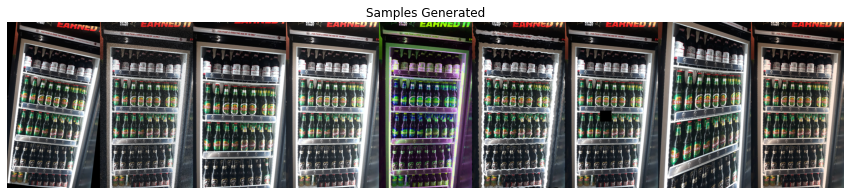

In [6]:
# get augmented images
image_rotated = rotate.augment_images([image])
image_noise = gaussian_noise.augment_images([image])
image_crop = crop.augment_images([image])
image_brightness = brightness.augment_images([image])
image_hue = hue.augment_images([image])
image_trans = elastic_trans.augment_images([image])
image_coarse = coarse_drop.augment_images([image])
image_perspective = perspective.augment_images([image])
image_color = color.augment_images([image])

# create an array of images for the demo
images_aug = [image_rotated[0], image_noise[0], image_crop[0], image_brightness[0], image_hue[0],  
              image_trans[0], image_coarse[0], image_perspective[0], image_color[0]]

# plot samples
plt.figure(figsize=(15,10))
plt.axis('off')
plt.imshow(np.hstack(images_aug))
plt.title('Samples Generated')

In [0]:
# define the pipeline
aug_pipeline = iaa.Sequential([
    iaa.Sometimes(0.5, iaa.GaussianBlur((0, 0.5))), 
    # applying Dropout or CoarseDropout
    iaa.OneOf([
        iaa.Dropout((0.01, 0.1), per_channel=0.5),
        #iaa.CoarseDropout((0.03, 0.07), size_percent=(0.02, 0.05), per_channel=0.0001),
    ]),
    # apply from 0 to 3 of the augmentations from the list
    iaa.SomeOf((0, 3),[
        iaa.Sharpen(alpha=(0, 1.0), lightness=(0.75, 2.0)), # sharpen images
        iaa.Emboss(alpha=(0, 0.5), strength=(0, 1.5)), # emboss images
        iaa.Fliplr(0.5), # horizontally flip
        #iaa.RemoveSaturation(1.0),
        iaa.CLAHE(clip_limit=(7, 10)),
        iaa.LinearContrast((1.1, 1.2)),
        iaa.PerspectiveTransform(scale=(0.10, 0.2)),
        iaa.ChangeColorTemperature((1000, 15000)),
        #iaa.imgcorruptlike.Brightness(severity=2),
        iaa.pillike.EnhanceBrightness(),
        iaa.MultiplyAndAddToBrightness(mul=(1.0, 1.5), add=(0, 30))
        #iaa.Sometimes(0.5, iaa.CropAndPad(percent=(-0.25, 0.25))), # crop and pad 50% of the images
        #iaa.Sometimes(0.5, iaa.Affine(rotate=2)) # rotate 50% of the images
    ])
],
random_order=False # apply the augmentations in random order
)

# apply augmentation pipeline to sample image
images_aug = np.array([aug_pipeline.augment_image(image) for _ in range(10)])

In [0]:
def gallery(array, ncols=4):
    '''
    Function to arange images into a grid.
    INPUT:
        array - numpy array containing images
        ncols - number of columns in resulting imahe grid
    OUTPUT:
        result - reshaped array into a grid with given number of columns
    '''
    nindex, height, width, intensity = array.shape
    nrows = nindex//ncols
    assert nindex == nrows*ncols
    result = (array.reshape(nrows, ncols, height, width, intensity)
              .swapaxes(1,2)
              .reshape(height*nrows, width*ncols, intensity))
    return result

Text(0.5, 1.0, 'Augmentation pipeline examples')

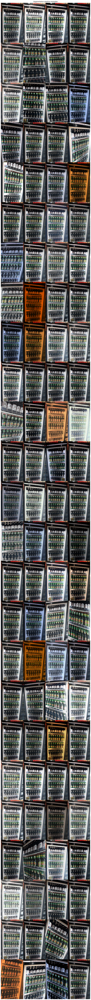

In [9]:
# visualize the augmented images
plt.figure(figsize=(150,150))
plt.axis('off')
plt.imshow(gallery(images_aug, ncols = 4))
plt.title('Augmentation pipeline examples')


In [0]:
for i, image_aug in enumerate(images_aug):
  imageio.imwrite("%d.jpg" % (i,), image_aug)

In [0]:
#plt.savefig('/content/drive/My Drive/ABI/Edited Images')

<Figure size 432x288 with 0 Axes>

In [0]:
for i, image_aug in enumerate(images_aug):
  imageio.imwrite(os.path.join('/content/drive/My Drive/ABI/Edited Images', "%06d.jpg" % (i,)), image_aug)